In [1]:
%%bash
# Run this everytime you restart your kernel or relaunch the server
pip install scprep umap-learn phenograph tasklogger graphtools

  Using cached scprep-1.2.3-py3-none-any.whl (94 kB)
  Using cached umap_learn-0.5.7-py3-none-any.whl (88 kB)
  Using cached PhenoGraph-1.5.7-py3-none-any.whl (159 kB)
  Using cached tasklogger-1.2.0-py3-none-any.whl (14 kB)
  Using cached graphtools-1.5.3-py3-none-any.whl (45 kB)
  Using cached numba-0.60.0-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (3.7 MB)
  Using cached pynndescent-0.5.13-py3-none-any.whl (56 kB)
  Using cached leidenalg-0.10.2-cp38-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.0 MB)
  Using cached Deprecated-1.2.15-py2.py3-none-any.whl (9.9 kB)
  Using cached PyGSP-0.5.1-py2.py3-none-any.whl (1.8 MB)
  Using cached igraph-0.11.8-cp39-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.1 MB)
  Using cached llvmlite-0.43.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (43.9 MB)
  Using cached wrapt-1.17.0-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (83 kB)
  Using cached t

In [2]:
# Run this cell every time you start working on the notebook
import pandas as pd
import numpy as np
import scprep, umap 
import sklearn
import sklearn.cluster
import sklearn.manifold
import graphtools as gt
import phenograph
import matplotlib.pyplot as plt
import tasklogger

%matplotlib inline

In [3]:
tongue_data = scprep.io.load_csv('Tongue-counts.csv',cell_axis='row', sparse=True).transpose()
tongue_data.head()

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
A15.D041894.3_9_M.1.1,0.0,130.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B19.D041894.3_9_M.1.1,0.0,130.0,0.0,0.0,88.0,54.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,11.0,143.0,0.0,108.0,0.0,0.0,0.0
C21.D041894.3_9_M.1.1,0.0,44.0,0.0,0.0,6.0,25.0,104.0,0.0,0.0,0.0,...,0.0,0.0,0.0,27.0,44.0,0.0,60.0,0.0,20.0,0.0
E1.D041894.3_9_M.1.1,0.0,23.0,0.0,0.0,18.0,26.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10.0,120.0,0.0,13.0,0.0,61.0,0.0
F4.D041894.3_9_M.1.1,0.0,101.0,0.0,0.0,0.0,54.0,16.0,0.0,0.0,0.0,...,0.0,61.0,0.0,0.0,100.0,67.0,0.0,0.0,0.0,0.0


In [4]:
tongue_data.shape

(1432, 23433)

In [5]:
trachea_data = scprep.io.load_csv('Trachea-counts.csv',cell_axis='row', sparse=True).transpose()

display(trachea_data.head())
print(trachea_data.shape)

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
A7.D042474.3_8_M.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,20.0,0.0,84.0,0.0,0.0,0.0
B21.D042474.3_8_M.1.1,0.0,135.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,115.0,0.0,306.0,0.0,0.0,0.0,0.0,0.0,0.0
D16.D042474.3_8_M.1.1,0.0,4.0,85.0,0.0,51.0,0.0,0.0,0.0,0.0,0.0,...,7.0,0.0,0.0,0.0,224.0,3.0,8.0,0.0,0.0,0.0
F10.D042474.3_8_M.1.1,0.0,135.0,136.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
H14.D042474.3_8_M.1.1,0.0,318.0,251.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,269.0,0.0,247.0,0.0,73.0,0.0


(1391, 23433)


## 1. Let's clean up the tongue cell first

In [6]:
lookup = pd.Series(tongue_data.index).apply(lambda x: x.split('.')[1])
tongue_metadata = pd.read_csv('metadata_FACS.csv', index_col=0).loc[lookup.values].reset_index()
tongue_metadata.index = tongue_data.index
tongue_metadata.head()

,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex
A15.D041894.3_9_M.1.1,D041894,3_9_M,Tongue,NaN,Multiple,M
B19.D041894.3_9_M.1.1,D041894,3_9_M,Tongue,NaN,Multiple,M
C21.D041894.3_9_M.1.1,D041894,3_9_M,Tongue,NaN,Multiple,M
E1.D041894.3_9_M.1.1,D041894,3_9_M,Tongue,NaN,Multiple,M
F4.D041894.3_9_M.1.1,D041894,3_9_M,Tongue,NaN,Multiple,M


In [7]:
percentiles =  ( 15 , 90)
tongue_data, tongue_metadata = scprep.filter.filter_library_size(tongue_data, tongue_metadata, percentile=percentiles)
cutoff = 10
tongue_data = scprep.filter.filter_rare_genes(tongue_data, min_cells=cutoff)
tongue_data, tongue_metadata['library_size'] = scprep.normalize.library_size_normalize(tongue_data, return_library_size=True)
tongue_data = scprep.transform.sqrt(tongue_data)

## 2. Then clean up the trachea cell

In [8]:
lookup = pd.Series(trachea_data.index).apply(lambda x: x.split('.')[1])
trachea_metadata = pd.read_csv('metadata_FACS.csv', index_col=0).loc[lookup.values].reset_index()
trachea_metadata.index = trachea_data.index
trachea_metadata.head()

,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex
A7.D042474.3_8_M.1.1,D042474,3_8_M,Trachea,NaN,Multiple,M
B21.D042474.3_8_M.1.1,D042474,3_8_M,Trachea,NaN,Multiple,M
D16.D042474.3_8_M.1.1,D042474,3_8_M,Trachea,NaN,Multiple,M
F10.D042474.3_8_M.1.1,D042474,3_8_M,Trachea,NaN,Multiple,M
H14.D042474.3_8_M.1.1,D042474,3_8_M,Trachea,NaN,Multiple,M


In [9]:
percentiles =  ( 15 , 90)
trachea_data, trachea_metadata = scprep.filter.filter_library_size(trachea_data, trachea_metadata, percentile=percentiles)
cutoff = 10
trachea_data = scprep.filter.filter_rare_genes(trachea_data, min_cells=cutoff)
trachea_data, trachea_metadata['library_size'] = scprep.normalize.library_size_normalize(trachea_data, return_library_size=True)
trachea_data = scprep.transform.sqrt(trachea_data)

In [10]:
gene_difference = scprep.stats.differential_expression(tongue_data, trachea_data, measure='difference', direction='both', gene_names=None, n_jobs=-2)

/srv/conda/lib/python3.11/site-packages/scprep/utils.py:756: UserWarning: Input data has inconsistent column names. Subsetting to 13491 common columns. To retain all columns, use `common_columns_only=False`.
  warnings.warn(


In [11]:
gene_difference[:6]

,difference,rank
Krt14,11.721453,0
Gsn,-10.635745,1
Krt5,7.325292,2
Krt6a,7.172922,3
Mgp,-6.614422,4
Perp,6.529151,5


## Do a similar analysis as in the assignement 3 and 4

In [12]:
new_tongue_data = scprep.io.load_csv('Tongue-counts.csv',cell_axis='row', sparse=True).transpose()
new_trachea_data = scprep.io.load_csv('Trachea-counts.csv',cell_axis='row', sparse=True).transpose()
data = [new_tongue_data, new_trachea_data]
batch_labels = ['tongue', 'trachea']
data, sample_labels = scprep.utils.combine_batches(data, batch_labels)

In [13]:
lookup = pd.Series(data.index).apply(lambda x: x.split('.')[1])
metadata = pd.read_csv('metadata_FACS.csv', index_col=0).loc[lookup.values].reset_index()
metadata.index = data.index

In [14]:
percentiles=(15 , 90)
data, metadata = scprep.filter.filter_library_size(data, metadata, percentile=percentiles)
cutoff = 10
data = scprep.filter.filter_rare_genes(data, min_cells=cutoff)
data, metadata['library_size'] = scprep.normalize.library_size_normalize(data, return_library_size=True)
data = scprep.transform.sqrt(data)

#### <b> Running 'SparseInputPCA' on the data

In [15]:
from scprep.reduce import SparseInputPCA

In [16]:
pca = SparseInputPCA(n_components=50, method='svd')

# Fit the model and transform the data
data_pca = pca.fit_transform(data)

In [17]:
pc_loading_list = [pca.components_[i] for i in range(3)]
pc_loading_list_sorted = [np.argsort(np.abs(x))[::-1] for x in pc_loading_list]

In [18]:
j=1
gene_idx_2 = []
for i in pc_loading_list_sorted:
    gene_idx_1 = []
    for k in range(6):
       gene_idx_1.append(data.columns[i[k]])
    gene_idx_2.append(gene_idx_1)
    print(f"pc{j}_component")
    j+=1
    print(gene_idx_1)

pc1_component
['Gsn', 'Krt14', 'Mgp', 'Dcn', 'Krt6a', 'Krt5']
pc2_component
['Gsn', 'Cd74', 'H2-Ab1', 'Dcn', 'H2-Aa', 'H2-Eb1']
pc3_component
['Cytl1', 'Chad', 'Mgp', 'Wif1', 'Sparc', 'Clu']


In [20]:
df = pd.DataFrame(gene_idx_2).T
new_column_name = ['pc1', 'pc2', 'pc3']
df.columns = new_column_name
df.index = pd.RangeIndex(start=1, stop=len(df) + 1, step=1)
df['Gene expression difference'] = gene_difference[:6].index

In [21]:
df

,pc1,pc2,pc3,Gene expression difference
1,Gsn,Gsn,Cytl1,Krt14
2,Krt14,Cd74,Chad,Gsn
3,Mgp,H2-Ab1,Mgp,Krt5
4,Dcn,Dcn,Wif1,Krt6a
5,Krt6a,H2-Aa,Sparc,Mgp
6,Krt5,H2-Eb1,Clu,Perp


In [22]:
df.to_csv('gene.csv')

### Drawing using these specific genes

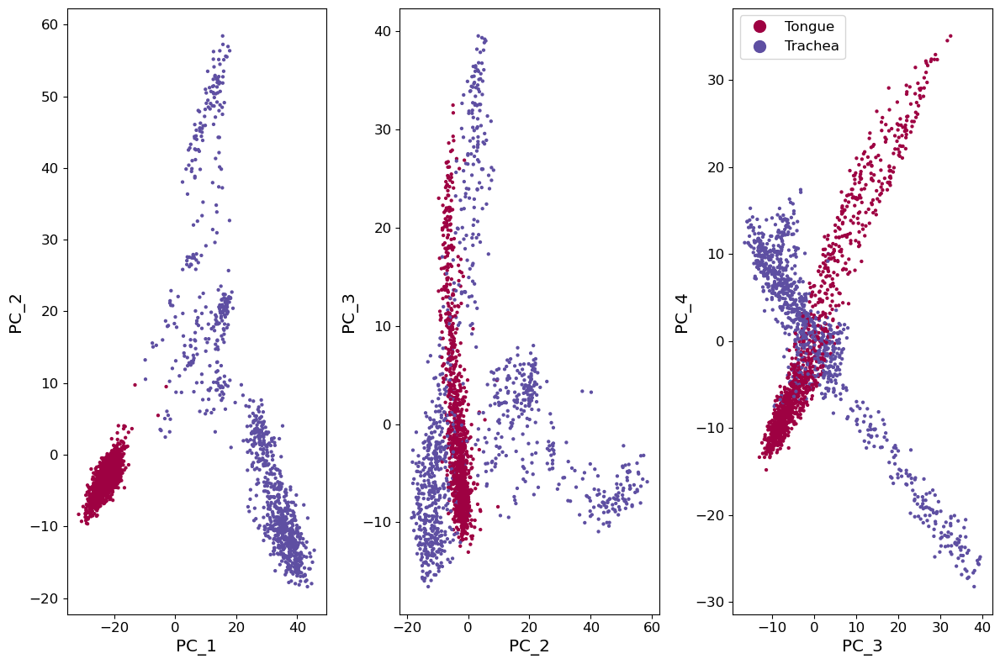

In [23]:
data_pca = scprep.reduce.pca(data, n_components=50, method='dense')

fig, axes = plt.subplots(1,3, figsize=(12, 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    scprep.plot.scatter(data_pca.iloc[:,i], data_pca.iloc[:,i+1], c=metadata['tissue'],
                        cmap='Spectral', ax=ax,
                        xlabel="PC_" + str(i+1), ylabel="PC_" + str(i+2), legend=legend)
    
fig.tight_layout() 

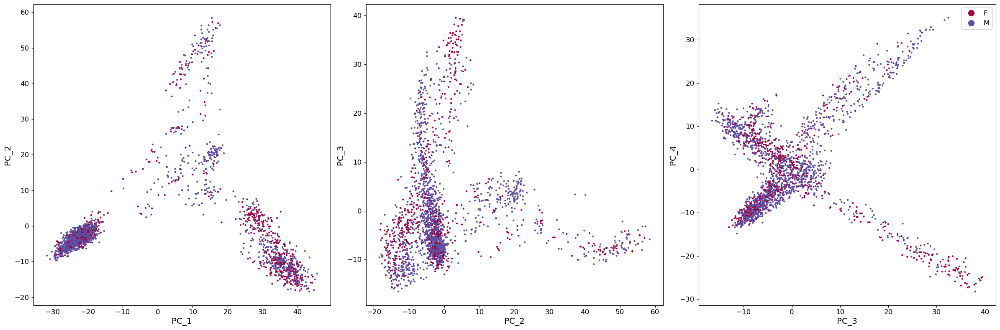

In [24]:
fig, axes = plt.subplots(1,3, figsize=(24,8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    scprep.plot.scatter(data_pca.iloc[:,i], data_pca.iloc[:,i+1], c=metadata['mouse.sex'],
                        cmap='Spectral', ax=ax,
                        xlabel="PC_" + str(i+1), ylabel="PC_" + str(i+2), legend=legend)
    
fig.tight_layout()

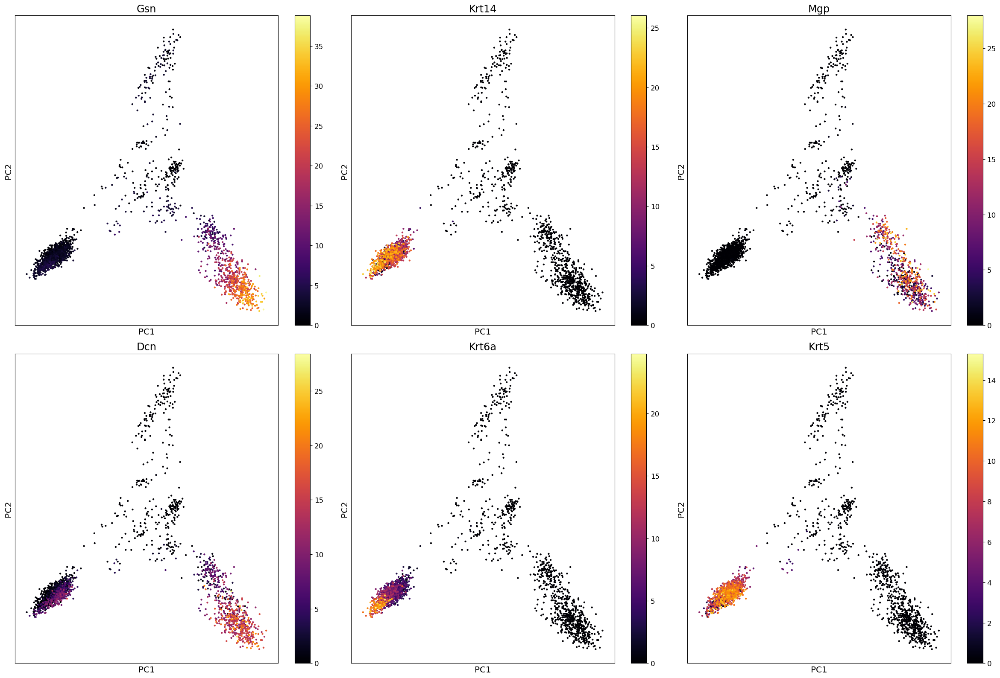

In [25]:
fig, axes = plt.subplots(2,3, figsize=(24, 16))
axes = axes.flatten()

expression_list = []
for gene in df['pc1']:
    expression_list.append(scprep.select.select_cols(data, exact_word=gene))

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    sort_index = expression_list[i].sort_values().index
    scprep.plot.scatter2d(data_pca.loc[sort_index], c=expression_list[i].loc[sort_index], shuffle=False, ax=ax,
                      title=df['pc1'][i+1], ticks=None, label_prefix='PC')

fig.tight_layout()

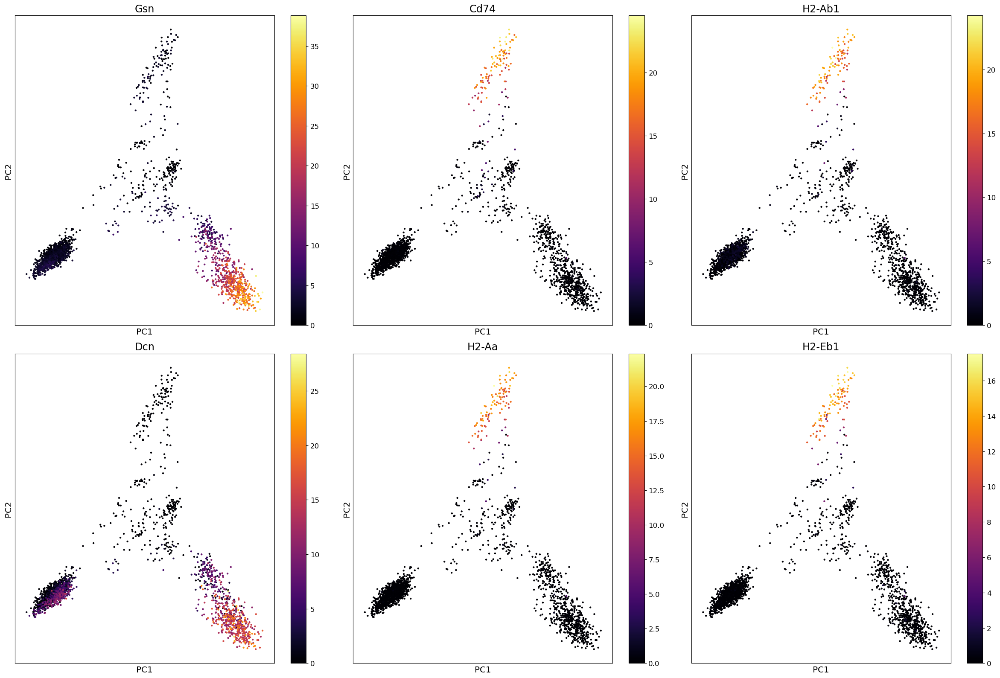

In [30]:
fig, axes = plt.subplots(2,3, figsize=(24, 16))
axes = axes.flatten()

expression_list = []
for gene in df['pc2']:
    expression_list.append(scprep.select.select_cols(data, exact_word=gene))

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    sort_index = expression_list[i].sort_values().index
    scprep.plot.scatter2d(data_pca.loc[sort_index], c=expression_list[i].loc[sort_index], shuffle=False, ax=ax,
                      title=df['pc2'][i+1], ticks=None, label_prefix='PC')

fig.tight_layout()

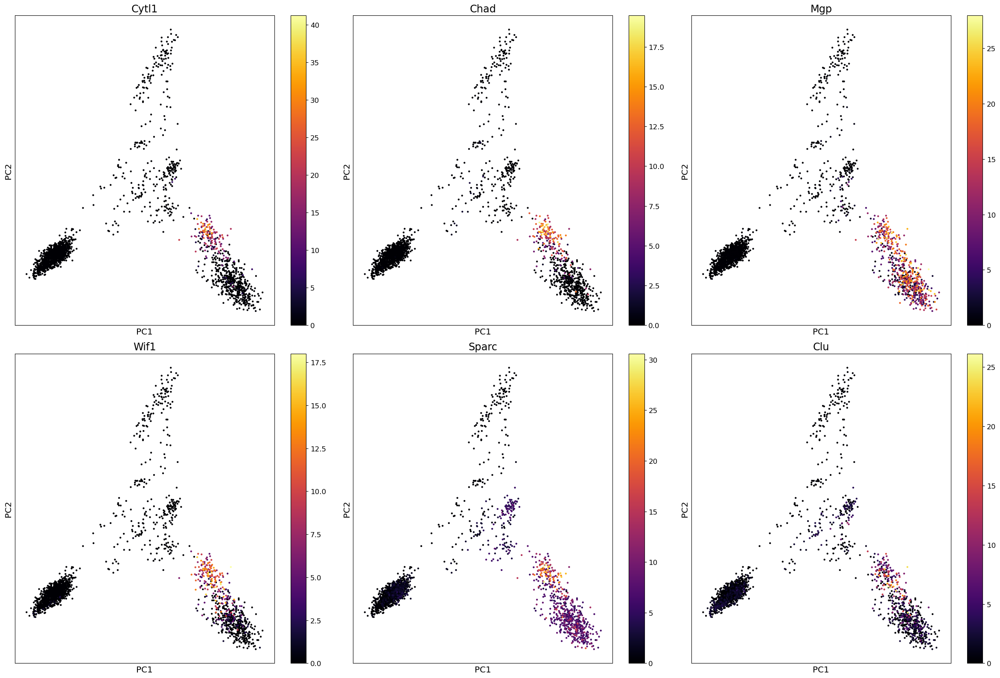

In [31]:
fig, axes = plt.subplots(2,3, figsize=(24, 16))
axes = axes.flatten()

expression_list = []
for gene in df['pc3']:
    expression_list.append(scprep.select.select_cols(data, exact_word=gene))

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    sort_index = expression_list[i].sort_values().index
    scprep.plot.scatter2d(data_pca.loc[sort_index], c=expression_list[i].loc[sort_index], shuffle=False, ax=ax,
                      title=df['pc3'][i+1], ticks=None, label_prefix='PC')

fig.tight_layout()

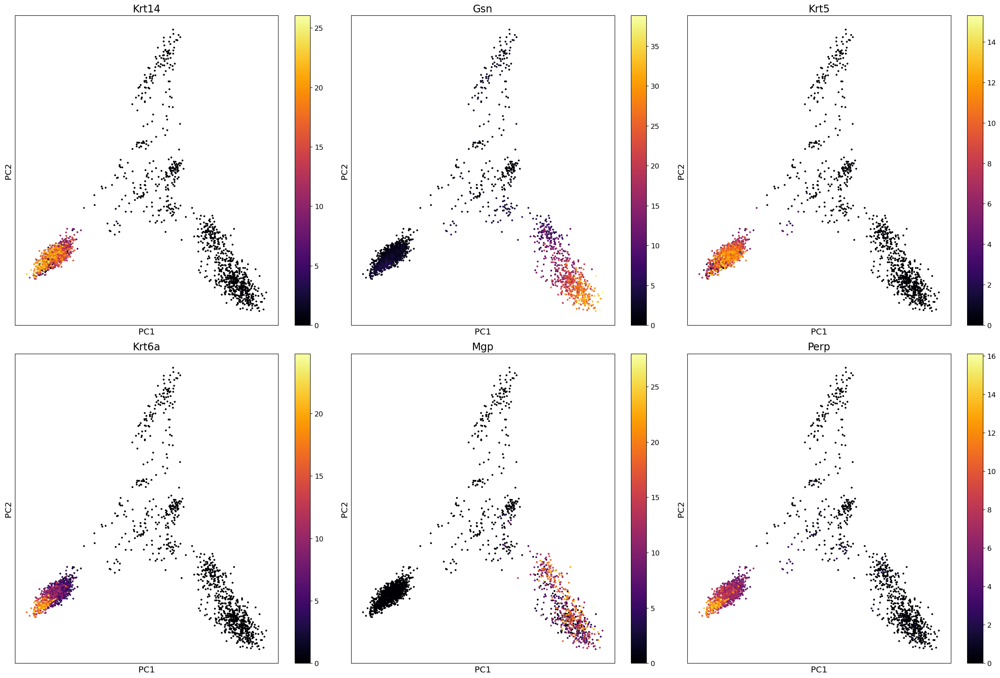

In [32]:
fig, axes = plt.subplots(2,3, figsize=(24, 16))
axes = axes.flatten()

expression_list = []
for gene in df['Gene expression difference']:
    expression_list.append(scprep.select.select_cols(data, exact_word=gene))

for i, ax in enumerate(axes):
    legend = True if i == 2 else False
    sort_index = expression_list[i].sort_values().index
    scprep.plot.scatter2d(data_pca.loc[sort_index], c=expression_list[i].loc[sort_index], shuffle=False, ax=ax,
                      title=df['Gene expression difference'][i+1], ticks=None, label_prefix='PC')

fig.tight_layout()

#### <b> Embedding Data Using UMAP

In [33]:
import umap.umap_ as umap
data_umap = umap.UMAP().fit_transform(data_pca.iloc[:,:50])

In [34]:
data_umap = pd.DataFrame(data_umap, index = data.index)

In [35]:
%matplotlib inline

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

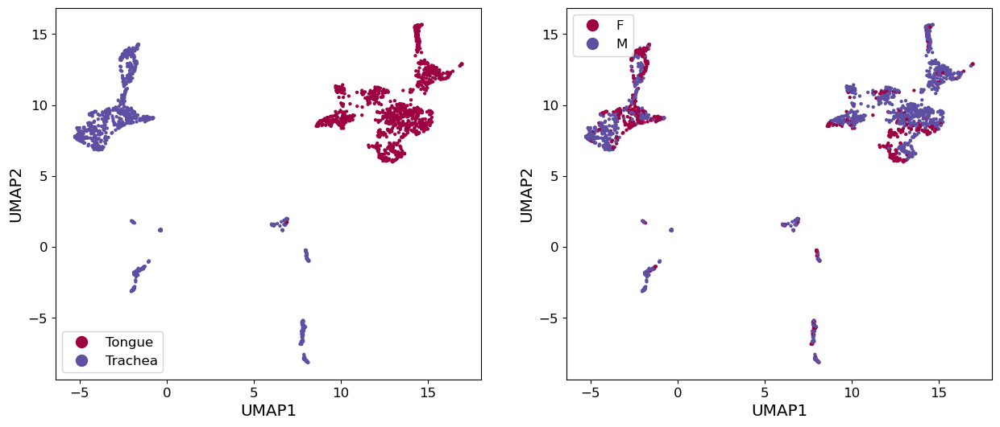

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(15,6)) ## feel free to adjust size

scprep.plot.scatter2d( 
  data_umap, cmap='Spectral',
  c=metadata['tissue'], ax=ax[0],
  label_prefix="UMAP"
)

scprep.plot.scatter2d( 
  data_umap, cmap='Spectral',
  c=metadata['mouse.sex'], ax=ax[1],
  label_prefix="UMAP"
)

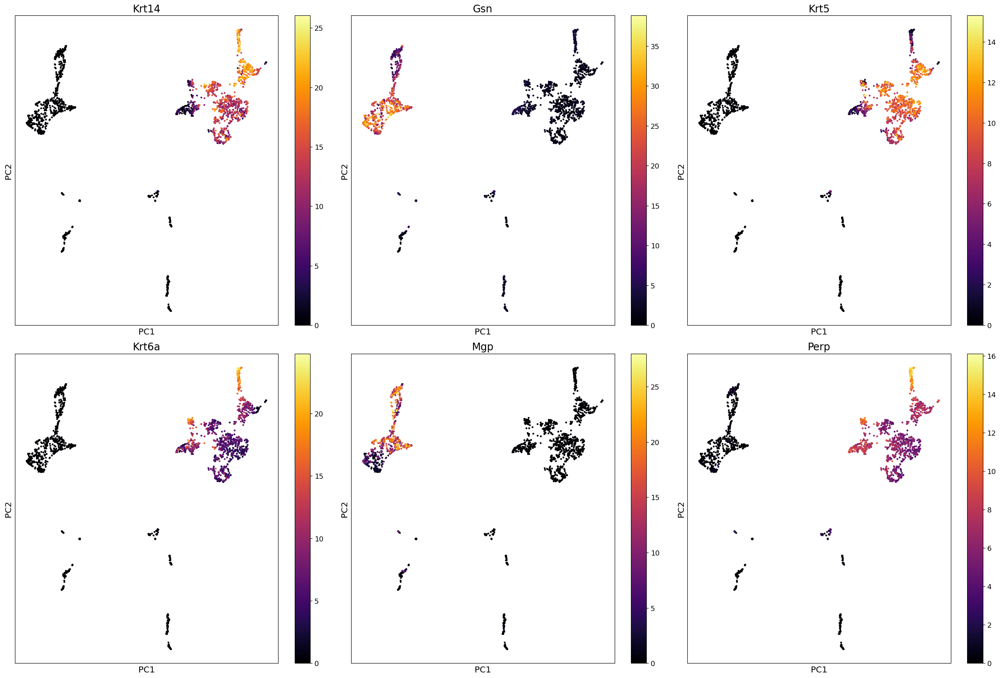

In [37]:
genes_for_plotting = df['Gene expression difference']
fig, axes = plt.subplots(2, 3, figsize=(24, 16))

for gene, ax in zip(genes_for_plotting, axes.flatten()):
    expression = expression = scprep.select.select_cols(data, exact_word=gene)
    sort_index = expression.sort_values().index

    scprep.plot.scatter2d(data_umap.loc[sort_index], c=expression.loc[sort_index],
                          shuffle=False, title=gene, 
                          label_prefix='PC', ticks=None, ax=ax)
fig.tight_layout()

## <b> Trying phenpograph, KMeans and spectral clusters

In [40]:
with tasklogger.log_task("phenograph"):
    phenograph_clusters, _, _ = phenograph.cluster(data_pca)

with tasklogger.log_task("KMeans"):
    kmeans_clusters = sklearn.cluster.KMeans(n_clusters = 16).fit_predict(data_pca)

Calculating phenograph...
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.05934453010559082 seconds
Jaccard graph constructed in 0.6130392551422119 seconds
Wrote graph to binary file in 0.06212782859802246 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.87796
Louvain completed 21 runs in 0.6050553321838379 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 1.5940911769866943 seconds
Calculated phenograph in 1.60 seconds.
Calculating KMeans...


/srv/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Calculated KMeans in 1.06 seconds.


In [41]:
import graphtools as gt
G = gt.Graph(data_pca)
G_igraph = G.to_igraph()

with tasklogger.log_task("Spectral clustering"):
    spec_op = sklearn.cluster.SpectralClustering(n_clusters = 5, affinity='precomputed')
    spectral_clusters = spec_op.fit_predict(G.K)

Calculating Spectral clustering...
Calculated Spectral clustering in 2.49 seconds.


In [42]:
clusterings = {'Phenograph':phenograph_clusters,
               'KMeans':kmeans_clusters,
               'Spectral':spectral_clusters}

for alg in clusterings:
    cl_nu = scprep.utils.sort_clusters_by_values(clusterings[alg], -data_pca.iloc[:,0])
    clusterings[alg] = cl_nu

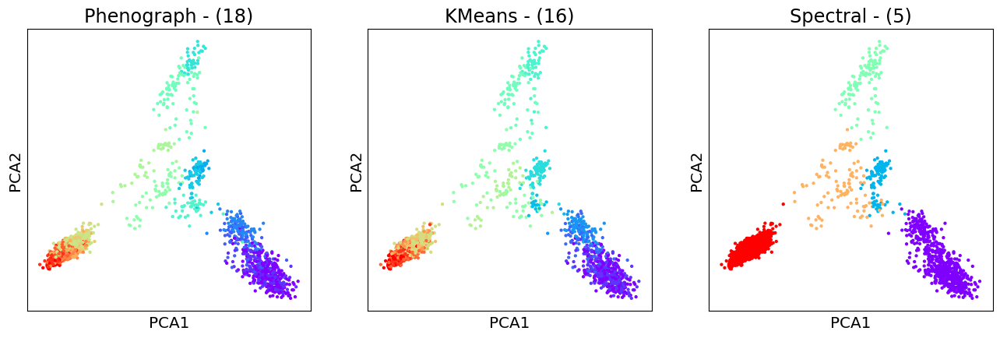

In [43]:
fig, axes = plt.subplots(1,3, figsize=(16,16), subplot_kw={'aspect':'equal'})

for ax, algorithm in zip(axes.flatten(), clusterings):
  scprep.plot.scatter2d(data_pca, c=clusterings[algorithm], cmap=plt.cm.rainbow,
                        title='{} - ({})'.format(algorithm, len(np.unique(clusterings[algorithm]))),
                        ticks=False, label_prefix="PCA", legend=False, discrete=True,
                        ax=ax)

### <b> Choosing n_clusters rationally

In [44]:
from sklearn.model_selection import train_test_split
from itertools import combinations
from scipy import sparse

def get_comemberships(dat, n_clusters, model, kwargs={}):
  model = model(n_clusters=n_clusters, **kwargs)
  model.fit(dat)

  labels = model.predict(dat)
  comember = labels_to_mat(labels, n_clusters, N=dat.shape[0])

  return comember, model

def labels_to_mat(labels, n_clusters, N):
  comember = np.zeros((N, N), dtype=bool)
  for i in range(n_clusters):
    match_idx = np.where(labels==i)[0]

    # slow, memory safe (we will symmetrize + add diagonal after)
    match_idx = iter(combinations(match_idx, 2))
    for (j,k) in match_idx:
      comember[j,k] = True

  # transpose here is memory bottleneck
  comember = np.maximum(comember, comember.transpose())
  comember[np.diag_indices_from(comember)] = True

  # sparsify output for storage space
  comember = sparse.csr_matrix(comember)
  return comember

def prediction_strength(full_dat, n_clusters, n_CV=3,
                        verbose=False, model=sklearn.cluster.KMeans,
                        kwargs={}):
  test_size = 1./n_CV
  res = []
  for i in range(n_CV):
    train_dat, test_dat = train_test_split(full_dat, test_size=test_size)
    N_test = test_dat.shape[0]
    __, train_model  = get_comemberships(train_dat, n_clusters, model=model, kwargs=kwargs)
    ground_truth, __ = get_comemberships(test_dat, n_clusters, model=model, kwargs=kwargs)

    pred_labels      = labels_to_mat(train_model.predict(test_dat), n_clusters, N_test)

    # when match_count is N_test**2, there is no error
    match_count      = ground_truth.minimum(pred_labels).sum()
    res.append(match_count/(N_test**2))

  if verbose:
    print(res)

  return np.mean(res)

In [45]:
start = 2
end   = 7

pred_strengths = []
for i in range(start, end):
  pred_strengths.append(prediction_strength(full_dat=data,
                                            n_clusters=i, n_CV=3,
                        verbose=False, model=sklearn.cluster.KMeans,
                        kwargs={}))

/srv/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


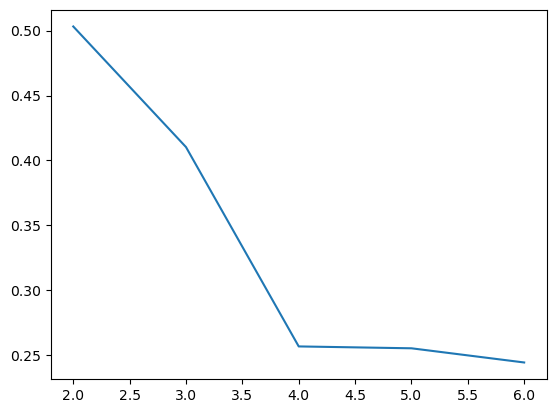

In [46]:
n_clusters = list(range(2, end))
plt.plot(n_clusters, pred_strengths)
plt.show()

/srv/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


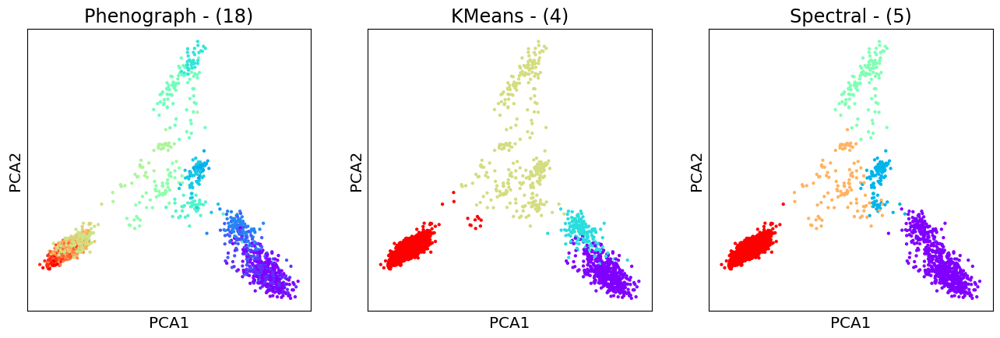

In [60]:
optimal_n_clusters = 4
kmeans_clusters = sklearn.cluster.KMeans(n_clusters=optimal_n_clusters).fit_predict(data_pca)

clusterings['KMeans'] = kmeans_clusters


## revisualize your clusterings for KMeans vs others
for alg in clusterings:
    cl_nu = scprep.utils.sort_clusters_by_values(clusterings[alg], -data_pca.iloc[:,0])
    clusterings[alg] = cl_nu

fig, axes = plt.subplots(1,3, figsize=(16,16), subplot_kw={'aspect':'equal'})

for ax, algorithm in zip(axes.flatten(), clusterings):
  scprep.plot.scatter2d(data_pca, c=clusterings[algorithm], cmap=plt.cm.rainbow,
                        title='{} - ({})'.format(algorithm, len(np.unique(clusterings[algorithm]))),
                        ticks=False, label_prefix="PCA", legend=False, discrete=True,
                        ax=ax)

### <b> Comparing clustering methods quantitatively

In [48]:
all_clusterings = []
all_algorithms = list(clusterings.keys())
for algo in all_algorithms:
    all_clusterings.append(clusterings[algo])
all_clusterings = np.vstack(all_clusterings)

In [49]:
from scipy.spatial.distance import pdist, squareform
cluster_similarities = squareform(pdist(all_clusterings, metric=sklearn.metrics.adjusted_rand_score))
# squareform assumes diagonals will be 0, but they're actually 1 because this is a similarity metric
# so we need to add 1's on the diagonal with np.eye()
cluster_similarities = cluster_similarities + np.eye(3)

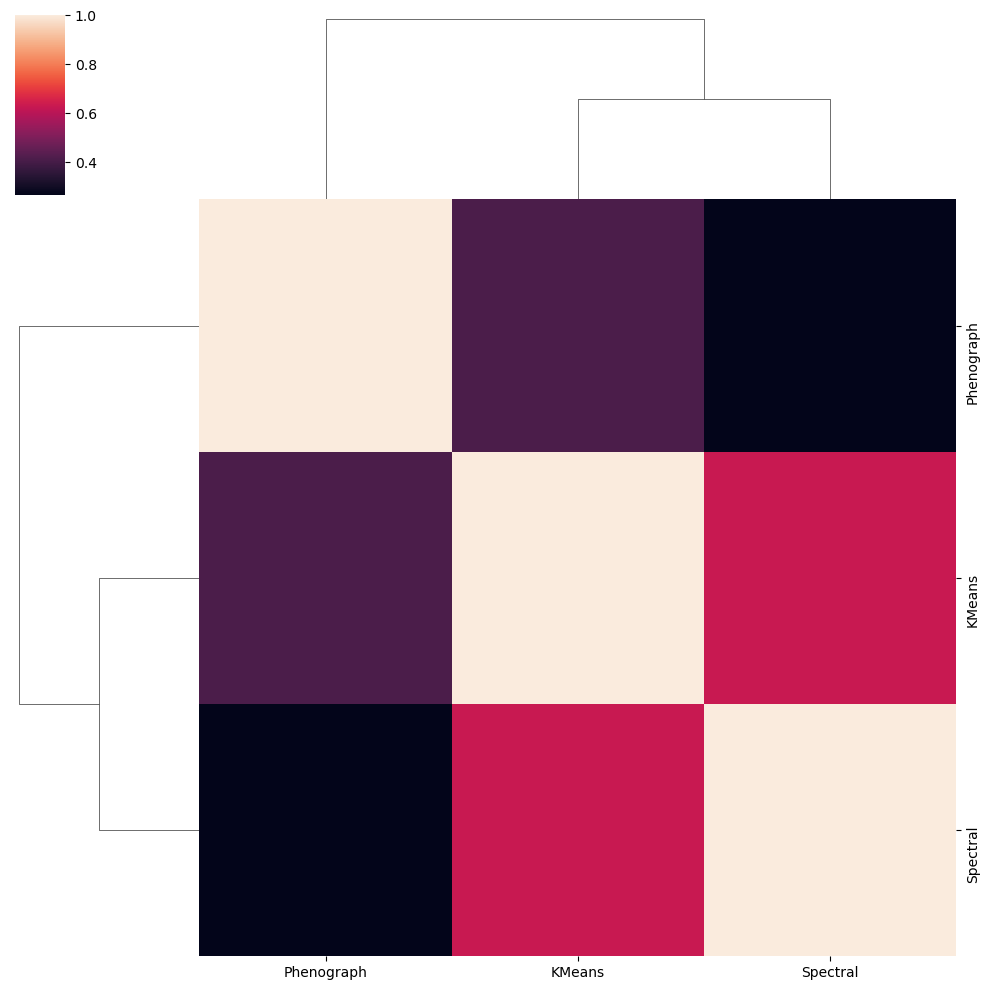

In [50]:
import seaborn as sns
sns.clustermap(cluster_similarities, xticklabels=all_algorithms, yticklabels=all_algorithms)
plt.show()

## <b> 3. Analysis - Jitterplot

In [53]:
with tasklogger.log_task("KMeans"):
    kmeans_clusters = sklearn.cluster.KMeans(n_clusters = 16).fit_predict(data_pca)
clusters = clusterings['KMeans']

Calculating KMeans...


/srv/conda/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Calculated KMeans in 1.42 seconds.


<Axes: title={'center': 'Gsn'}, ylabel='Gsn'>

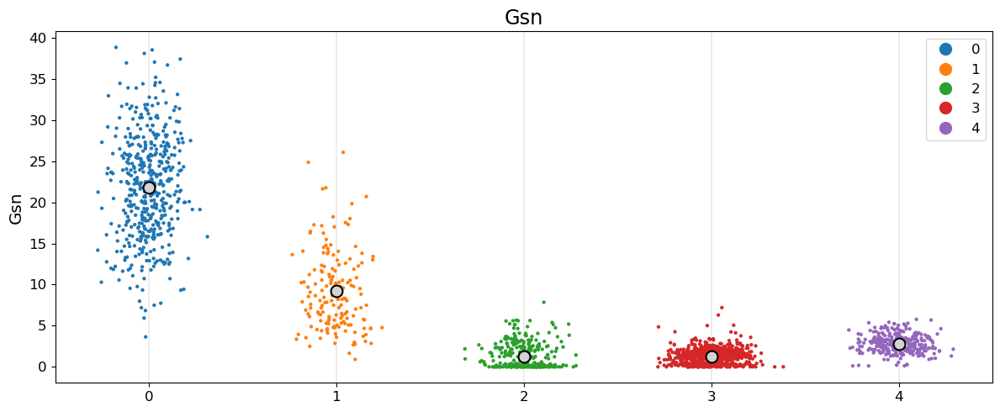

In [61]:
curr_gene = "Gsn"
curr_expression = scprep.select.select_cols(data, exact_word=curr_gene)
scprep.plot.jitter(clusters, curr_expression, c=clusters, figsize=(12, 5),
                   legend_anchor=(1,1), title=curr_gene)

<Axes: title={'center': 'Krt14'}, ylabel='Krt14'>

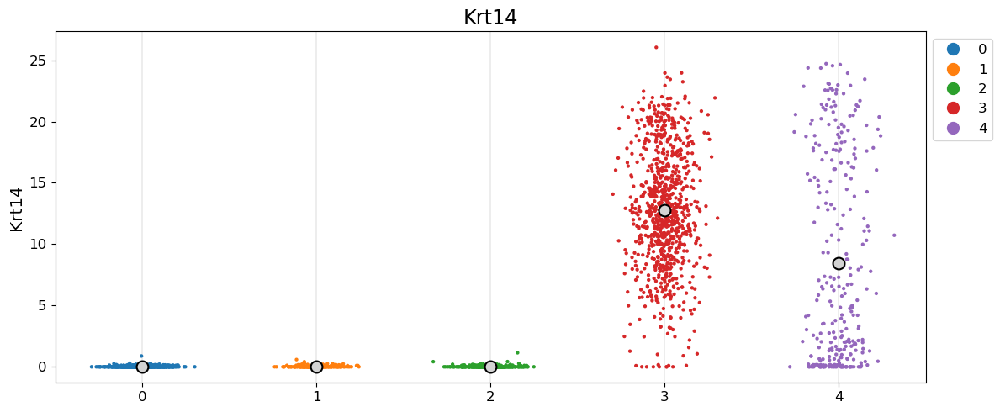

In [62]:
curr_gene = "Krt14"
curr_expression = scprep.select.select_cols(data, exact_word=curr_gene)
scprep.plot.jitter(clusters, curr_expression, c=clusters, figsize=(12, 5),
                   legend_anchor=(1,1), title=curr_gene)

### <b> Research

In [56]:
metadata['FACS.selection']

A15.D041894.3_9_M.1.1_tongue        Multiple
B19.D041894.3_9_M.1.1_tongue        Multiple
C21.D041894.3_9_M.1.1_tongue        Multiple
E1.D041894.3_9_M.1.1_tongue         Multiple
F4.D041894.3_9_M.1.1_tongue         Multiple
                                      ...   
O22.MAA001867.3_39_F.1.1_trachea    Multiple
J18.MAA001867.3_39_F.1.1_trachea    Multiple
M11.MAA001867.3_39_F.1.1_trachea    Multiple
N19.MAA001867.3_39_F.1.1_trachea    Multiple
P1.MAA001867.3_39_F.1.1_trachea     Multiple
Name: FACS.selection, Length: 2116, dtype: object

<Axes: title={'center': 'Kmeans - (5)'}, xlabel='PCA1', ylabel='PCA2'>

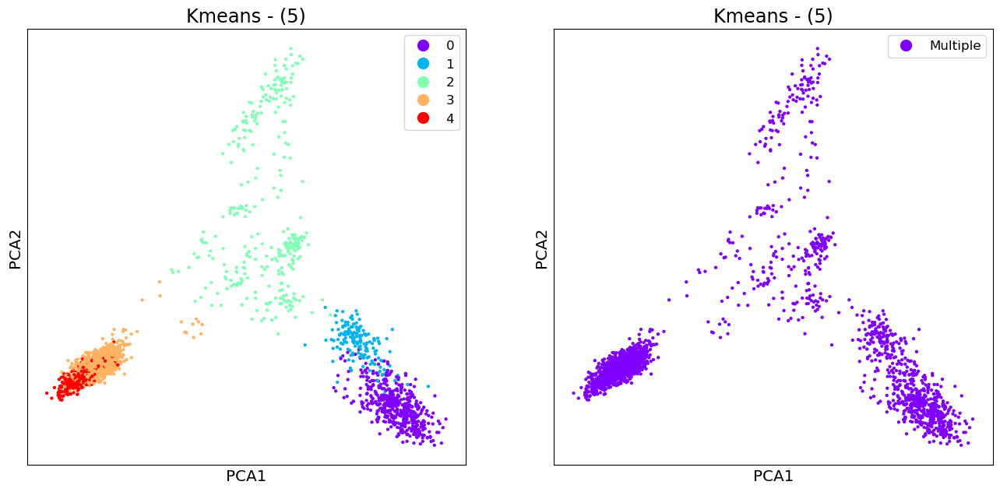

In [57]:
# We will look at the low dimensional representation of our cells, coloured both by cluster number and their
# FACS label

fig, axes = plt.subplots(1,2, figsize=(16,16), subplot_kw={'aspect':'equal'})

# TODO:
scprep.plot.scatter2d(data_pca, c=clusters, cmap=plt.cm.rainbow,
                        # TO DO -- write the name of your algorithm
                      title='{} - ({})'.format('Kmeans', len(np.unique(clusters))),
                      ticks=False, label_prefix="PCA", legend=True, discrete=True,
                      ax=axes[0])

scprep.plot.scatter2d(data_pca, c=metadata['FACS.selection'], cmap=plt.cm.rainbow,
                        # TO DO -- write the name of your algorithm
                      title='{} - ({})'.format('Kmeans', len(np.unique(clusters))),
                      ticks=False, label_prefix="PCA", legend=True, discrete=True,
                      ax=axes[1])

In [71]:
scprep.plot.rotate_scatter3d(data_pca)